***
#### About this document
This is the assignment for the UCL CASA module Data Science for Spatial Systems (CASA0006) <br>
**Code is hosted [here]**<br>
**Data is availble [here]**
***

# Nonlinear effects of public transport accessibility on urban development: 
<p style="color:DimGray; text-align:left; font-size:20px"><i> the case of Chongqing City </i></p>
<a id="ID_title"></a>

<p style="color:DimGray; text-align:left;"><i>This paper explores data from . <br>It highlights</i></p>

---

<a id="ID_intr"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 1.0 | Introduction

data [transport](https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=d39b1ec75e5f1f9033b1bc00952c4ced&output=json&city=重庆&offset=2&keywords=轨道交通1号线&platform=JS) json file

In [12]:
import sys
print(sys.version)

3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]


In [45]:

import requests
import warnings
warnings.filterwarnings('ignore')
import os
import json
import math
import csv
import joblib
import pandas as pd
import numpy as np
# !pip install osm2gmns
import osm2gmns as og
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon, LinearRing
from shapely.geometry import shape, MultiPolygon, MultiLineString, MultiPoint
from glob import glob
import networkx as nx
import contextily as cx
#!pip install ChangeCoordinate
from ChangeCoordinate import ChangeCoord
#!pip install folium mapclassify
import sklearn
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict,GridSearchCV,cross_validate
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from lightgbm import LGBMRegressor
import shap


<a id="ID_lit"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore]("#section_ID") | [6.0 Analysis](#ID_Intro) | [7.0 Results]("#section_ID") | [8.0 Discussion](#ID_Intro) | [Bibliography](#ID_Intro) | [Appendix](#ID_Intro) |

## 2.0 | Literature review

<a id="ID_method"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 3.0 | Methodology

<a id="ID_data"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 4.0 | Datasets


### 4.1 | Metro Station

In [14]:
def get_data(line):
    print(line)
    url=("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode=88de710fc1d55dbefd60d24831c27d5f"). \
    format(line)
    
    r=requests.get(url).json()
    df = pd.DataFrame(r['buslines'][0]['busstops'])
    return df
# spare url=("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=d39b1ec75e5f1f9033b1bc00952c4ced&output=json&city=重庆&offset=2&keywords={}&platform=JS"). \
# spare key: 6e0e286fb0ddd87779b1ff5ee653e9fa

In [13]:
line_names = ['轨道交通1号线', '轨道交通2号线', '轨道交通3号线', '轨道交通3号线北延线','轨道交通4号线', '5号线', 
              '轨道交通6号线','轨道交通6号线支线（国博线）','轨道交通9号线','轨道交通10号线',
              '轨道交通江跳线','轨道交通环线（外环）','轨道交通环线（内环）']
line = line_names
url = ("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode=88de710fc1d55dbefd60d24831c27d5f"). \
format(line)
r = requests.get(url).json()
r.keys()

dx = pd.concat([get_data(line) for line in line_names], axis=0)
dx

轨道交通1号线
轨道交通2号线
轨道交通3号线
轨道交通3号线北延线
轨道交通4号线
5号线
轨道交通6号线
轨道交通6号线支线（国博线）
轨道交通9号线
轨道交通10号线
轨道交通江跳线
轨道交通环线（外环）
轨道交通环线（内环）


,id,location,name,sequence
0,BV10049208,"106.585845,29.564142",朝天门,1
1,BV10045951,"106.583159,29.559168",小什字,2
2,BV10045314,"106.571829,29.553173",较场口,3
3,BV10045298,"106.56291,29.554914",七星岗,4
4,BV10045318,"106.548514,29.552864",两路口,5
...,...,...,...,...
29,BV11102222,"106.453159,29.495547",华龙,30
30,BV10668313,"106.439385,29.500105",重庆西站,31
31,BV11102218,"106.442419,29.517693",上桥,32
32,BV11102223,"106.449365,29.524457",凤鸣山,33


In [14]:
ccg = ChangeCoord()

x = dx.iloc[0]['location']
lng, lat = float(x.split(',')[0]), float(x.split(',')[1])
ccg.gcj02_to_wgs84(lng,lat)

dx['coord_wg84'] = dx['location'].apply(lambda x: ccg.gcj02_to_wgs84(float(x.split(',')[0]), 
                                                                     float(x.split(',')[1])))
dx['coord_wg84'].str.get(1)
geometry = gpd.points_from_xy(dx['coord_wg84'].str.get(0), 
                              dx['coord_wg84'].str.get(1))

metro_sts = gpd.GeoDataFrame(dx[['id', 'location', 'name', 'sequence']],
                                geometry=geometry,
                                crs = 'epsg:4326')

# metro_sts.to_file('data/cq_metro_sts.shp')
# metro_sts.to_file('data/metro_sts.geojson', driver='GeoJSON')

In [15]:
# read saved metro stations data from github
metro_sts = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/metro_sts.geojson')
metro_sts.head(2)


,id,location,name,sequence,line,geometry
0,BV10049208,"106.585845,29.564142",朝天门,1,轨道交通1号线,POINT (106.58216 29.56703)
1,BV10045951,"106.583159,29.559168",小什字,2,轨道交通1号线,POINT (106.57947 29.56206)


In [16]:
metro_sts = metro_sts.to_crs(3857)
metro_sts['geometry'] = metro_sts['geometry'].buffer(600)

### 4.2 | Bus Station

In [ ]:
# takes around 10 mins to download the bus data from api

def get_data(line):
    url = ("https://restapi.amap.com/v3/bus/linename?s=rsv3&extensions=all&key=6e0e286fb0ddd87779b1ff5ee653e9fa&output=json&city=重庆&offset=2&keywords={}&platform=JS&jscode=88de710fc1d55dbefd60d24831c27d5f").format(line)
    r = requests.get(url).json()
    
    # Check if 'buslines' key exists and if it's not empty
    if 'buslines' in r and r['buslines']:
        # Extract bus stops data if available
        df = pd.DataFrame(r['buslines'][0]['busstops'])
        return df
    else:
        print(f"No bus lines found for {line}.")
        return pd.DataFrame()  # Return an empty DataFrame if no bus lines found

buslines = ['10路', '100路', '101路', '102路', '103路', '104路', '105路', '106路', '107路', '108路', '111路', '112路', '113路', '115路', '116路', '119路', '120路', '121路', '122路', '123路', '124路', '126路', '127路', '128路', '129路', '130路', '131路', '132路', '133路', '135路', '136路', '139路', '140路', '144路', '145路', '147路', '149路', '151路', '152路', '153路', '158路', '159路', 
         '167路', '168路', '169路', '170路', '172路', '175路', '176路', '177路', '178路', '179路', '180路', '181路', '182路', '183路', '184路', '185路', '186路', '188路', '191路', '192路', '193路', '194路', '195路', '196路', '197路', '198路', '199路', '1101路', '1105路', '1106路', '1107路', '1108路', '1109路', '1200路', '1226路', '1257路', '1265路', '1267路', '1288路', '1301路', '1302路', 
         '1303路', '1305路', '1306路', '1308路', '1410路', '1429路', '1449路', '1483路', '1492路', '1501路', '1503路', '1601路', '1605路', '1611路', '1612路', '1613路', '1615路', '1616路', '1619路', '1628路', '119区间', '1503区间', '190路环线', '1620路环线', '1625路环线', '1223路(环线)', '1407路(环线)', '28路', '29路', '200路', '202路', '204路', '205路', '206路', '207路', '208路', '209路', 
         '210路', '211路', '212路', '213路', '214路', '218路', '219路', '220路', '221路', '222路', '225路', '227路', '229路', '230路', '232路', '233路', '234路', '235路', '237路', '238路', '239路', '240路', '241路', '243路', '245路', '246路', '247路', '248路', '249路', '251路', '252路', '253路', '254路', '257路', '259路', '260路', '261路', '262路', '264路', '265路', '267路', '268路', '269路',
         '270路', '271路', '272路', '273路', '274路', '275路', '278路', '279路', '281路', '282路', '283路', '285路', '286路', '287路', '289路', '290路', '293路', '294路', '295路', '296路', '293区间', '295区间', '228路环线', '303路', '304路', '305路', '307路', '308路', '309路', '311路', '319路', '320路', '321路', '322路', '323路', '324路', '325路', '326路', '327路', '328路', '329路', '330路', 
         '332路', '334路', '335路', '336路', '338路', '339路', '340路', '341路', '342路', '343路', '344路', '345路', '347路', '348路', '349路', '350路', '352路', '353路', '355路', '356路', '357路', '359路', '360路', '361路', '362路', '363路', '364路', '365路', '366路', '367路', '370路', '371路', '372路', '377路', '378路', '379路', '380路', '381路', '382路', '383路', '384路', '387路', '389路', 
         '390路', '391路', '394路', '396路', '398路', '399路', '3101路', '3102路', '3103路', '3106路', '3202路', '3203路', '3208路', '3209路', '3210路', '3222路', '3232路', '3239路', '3265路', '3438路', '3451路', '3502路', '3505路', '3506路', '3508路', '3510路', '3511路', '3512路', '3515路', '3518路', '3602路', '3606路', '3608路', '3610路', '3611路', '3612路', '3613路', '3615路', '3617路', 
         '400路', '401路', '406路', '407路', '408路', '411路', '412路', '413路', '415路', '416路', '418路', '420路', '421路', '422路', '426路', '427路', '428路', '432路', '433路', '434路', '435路', '437路', '438路', '440路', '441路', '442路', '443路', '446路', '449路', '450路', '451路', '452路', '456路', '457路', '459路', '461路', '462路', '464路', '465路', '466路', '469路', '470路', '472路', 
         '473路', '474路', '475路', '478路', '479路', '481路', '483路', '489路', '491路', '494路', '496路', '498路', '499路', '501路', '504路', '505路', '506路', '508路', '511路', '512路', '515路', '516路', '517路', '520路', '528路', '529路', '530路', '533路', '539路', '543路', '545路', '546路', '548路', '551路', '555路', '559路', '561路', '564路', '565路', '566路', '568路', '569路', '570路', 
         '571路', '575路', '576路', '578路', '579路', '581路', '582路', '583路', '585路', '586路', '587路', '588路', '589路', '590路', '591路', '592路', '596路', '597路', '599路', '68路', '69路', '600路', '601路', '603路', '604路', '605路', '607路', '610路', '612路', '617路', '618路', '619路', '620路', '621路', '622路', '623路', '624路', '625路', '627路', '628路', '629路', '630路', '631路', 
         '633路', '634路', '636路', '637路', '638路', '640路', '641路', '642路', '643路', '644路', '645路', '646路', '647路', '650路', '651路', '653路', '656路', '657路', '658路', '661路', '662路', '666路', '667路', '669路', '671路', '672路', '676路', '678路', '679路', '680路', '682路', '683路', '684路', '685路', '686路', '687路', '688路', '689路', '691路', '692路', '693路', '694路', '695路',
         '696路', '697路', '698路', '699路', '803路', '806路', '807路', '808路', '809路', '812路', '813路', '815路', '816路', '817路', '819路', '822路', '823路', '825路', '826路', '827路', '829路', '830路', '831路', '832路', '833路', '835路', '836路', '837路', '839路', '840路', '841路', '842路', '843路', '844路', '845路', '846路', '847路', '848路', '849路', '851路', '852路', '854路', '855路',
         '856路', '857路', '858路', '860路', '861路', '862路', '863路', '865路', '866路', '867路', '869路', '870路', '872路', '873路', '878路', '881路', '882路', '883路', '884路', '886路', '889路', '890路', '891路', '892路', '893路', '896路', '898路', '910路', '911路', '914路', '918路', '919路', '921路', '924路', '930路', '937路', '945路', '955路', '957路', '959路', '960路', '961路', '962路', 
         '963路', '964路', '965路', '967路', '971路', '973路', '974路', '975路', '976路', '978路', '979路', '980路', '981路', '982路', '983路', '984路', '985路', '986路', '989路', '996路', '997路', '9006路', '9007路', '9010路', '9100路', '9600路', '9602路']
if buslines:
    bus = pd.concat([get_data(line) for line in buslines], axis=0)
else:
    bus = pd.DataFrame()

bus

No bus lines found for 363路.
No bus lines found for 662路.
No bus lines found for 671路.
No bus lines found for 9600路.


,id,location,name,sequence
0,BV10337795,"106.542847,29.46367",李家沱公交车场,1
1,BV10046122,"106.544709,29.464944",李家沱东,2
2,BV10046121,"106.550714,29.462554",巴南大道中,3
3,BV10046123,"106.557388,29.459909",巴南大道,4
4,BV11694420,"106.562708,29.466945",轨道麒龙站,5
...,...,...,...,...
7,BV09052805,"106.823021,29.71082",协同创新大桥东,8
8,BV09052804,"106.829295,29.710721",普福大道东,9
9,BV09083431,"106.832712,29.713704",御临路,10
10,BV09047690,"106.832974,29.717575",跨步路中段,11


In [185]:
ccg = ChangeCoord()

x = bus.iloc[0]['location']
lng, lat = float(x.split(',')[0]), float(x.split(',')[1])
ccg.gcj02_to_wgs84(lng,lat)

bus['coord_wg84'] = bus['location'].apply(lambda x: ccg.gcj02_to_wgs84(float(x.split(',')[0]), 
                                                                     float(x.split(',')[1])))
bus['coord_wg84'].str.get(1)
geometry = gpd.points_from_xy(bus['coord_wg84'].str.get(0), 
                              bus['coord_wg84'].str.get(1))

bus_sts = gpd.GeoDataFrame(bus[['id', 'location', 'name', 'sequence']],
                                geometry=geometry,
                                crs = 'epsg:4326')
bus_sts
# bus_sts.to_file('data/cq_bus_sts.geojson', driver='GeoJSON')

,id,location,name,sequence,geometry
0,BV10337795,"106.542847,29.46367",李家沱公交车场,1,POINT (106.53912 29.46654)
1,BV10046122,"106.544709,29.464944",李家沱东,2,POINT (106.54098 29.46782)
2,BV10046121,"106.550714,29.462554",巴南大道中,3,POINT (106.54700 29.46544)
3,BV10046123,"106.557388,29.459909",巴南大道,4,POINT (106.55369 29.46281)
4,BV11694420,"106.562708,29.466945",轨道麒龙站,5,POINT (106.55901 29.46985)
...,...,...,...,...,...
7,BV09052805,"106.823021,29.71082",协同创新大桥东,8,POINT (106.81906 29.71357)
8,BV09052804,"106.829295,29.710721",普福大道东,9,POINT (106.82534 29.71349)
9,BV09083431,"106.832712,29.713704",御临路,10,POINT (106.82876 29.71647)
10,BV09047690,"106.832974,29.717575",跨步路中段,11,POINT (106.82903 29.72035)


In [17]:
# re-read bus station data from github
bus_sts = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/cq_bus_sts.geojson')

### 4.3 | CBD Data

In [18]:
cbd = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/cbd.geojson')
cbd['geometry'] = cbd['geometry'].representative_point()
cbd['name'] = ['解放碑','江北嘴','弹子石']
ccg = ChangeCoord()
cbd['lng'] = cbd['geometry'].x
cbd['lat'] = cbd['geometry'].y
cbd['gcj02'] = cbd.apply(lambda x: ccg.wgs84_to_gcj02(x['lng'], x['lat']), axis=1)


### 4.4 | POI Data

In [11]:
# use gaode map api to get pois

# takes 1 hour in downloading, already saved in github in links below
'''
def get_amap_poi(city, keywords, page):
    amap_api_url = "https://restapi.amap.com/v3/place/text"
    # replace with your web api key
    api_key = "8dd06dd6bddfefffdc9e169b00d5191b"

    params = {"key": api_key,"keywords": keywords,"offset": 1000,"page": page,"city": city,"output": "json"}

    response = requests.get(amap_api_url, params=params)
    result = response.json()

    if result["status"] == "1" and int(result["count"]) > 0:
        pois = result["pois"]
        return pois
    else:
        print(f"Not found pois or error for keyword: {keywords}")
        return []

def save_to_csv(data, filename):
    file_path = os.path.join("data", filename)
    with open(file_path, 'w', newline='', encoding='utf-8') as csvfile:
        writer = csv.writer(csvfile)
        writer.writerow(['name', 'location', 'tel', 'pname', 'cityname', 'adname', 'address'])
        writer.writerows(data)

def main():
    city_name = "重庆市" 
    keywords_list = [] 
    page_num = 1
    output_label = ['name', 'location', 'tel', 'pname', 'cityname', 'adname', 'address']

    for keyword in keywords_list:
        pois = get_amap_poi(city_name, keyword, page_num)
        
        if pois:
            output_data = []
            for poi in pois:
                info = [poi[label] for label in output_label]
                output_data.append(info)
            
            save_to_csv(output_data, f"{keyword}.csv")
            print(f"Data saved to data/{keyword}.csv")
        else:
            print(f"Not found pois or error for keyword: {keyword}")

if __name__ == "__main__":
    main()
'''

'\ndef get_amap_poi(city, keywords, page):\n    amap_api_url = "https://restapi.amap.com/v3/place/text"\n    # replace with your web api key\n    api_key = "8dd06dd6bddfefffdc9e169b00d5191b"\n\n    params = {"key": api_key,"keywords": keywords,"offset": 1000,"page": page,"city": city,"output": "json"}\n\n    response = requests.get(amap_api_url, params=params)\n    result = response.json()\n\n    if result["status"] == "1" and int(result["count"]) > 0:\n        pois = result["pois"]\n        return pois\n    else:\n        print(f"Not found pois or error for keyword: {keywords}")\n        return []\n\ndef save_to_csv(data, filename):\n    file_path = os.path.join("data", filename)\n    with open(file_path, \'w\', newline=\'\', encoding=\'utf-8\') as csvfile:\n        writer = csv.writer(csvfile)\n        writer.writerow([\'name\', \'location\', \'tel\', \'pname\', \'cityname\', \'adname\', \'address\'])\n        writer.writerows(data)\n\ndef main():\n    city_name = "重庆市" \n    keyword

In [12]:
# read poi data
# will take about 2 mins
school = pd.read_excel('https://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/school.xlsx')
business_enterprises = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/business_enterprises.xlsx')
leisure_entertainment = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/leisure_entertainment.xlsx')
life_service = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/life_service.xlsx')
medical = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/medical.xlsx')
real_estate = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/real_estate.xlsx')
restaurants = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/restaurants.xlsx')
shopping = pd.read_excel('http://github.com/yiyansun/DSSS/raw/main/assessment/data/poi_select/shopping.xlsx')


In [13]:
# combine all poi data and rename the columns
poi_select = pd.concat([school, business_enterprises, leisure_entertainment, life_service, medical, real_estate, restaurants, shopping], axis=0)
poi_select.columns
poi_select.rename(columns={'名称': 'name','大类':'cate_1', '中类':'cate_2', '小类':'cate_3',
                           '地址':'address', '省':'province', '市':'city', '区':'district', '经度':'lng', '纬度':'lat'}, inplace=True)
poi_select.info()

<class 'pandas.core.frame.DataFrame'>
Index: 732866 entries, 0 to 235232
Data columns (total 10 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   name      732855 non-null  object 
 1   cate_1    732866 non-null  object 
 2   cate_2    732866 non-null  object 
 3   cate_3    732866 non-null  object 
 4   address   732862 non-null  object 
 5   province  732866 non-null  object 
 6   city      732866 non-null  object 
 7   district  732866 non-null  object 
 8   lng       732866 non-null  float64
 9   lat       732866 non-null  float64
dtypes: float64(2), object(8)
memory usage: 61.5+ MB


In [14]:
# convert poi data to geodataframe
## takes around 3 mins
poi = gpd.GeoDataFrame(poi_select, geometry=gpd.points_from_xy(poi_select['lng'], poi_select['lat']), crs='epsg:4326')
poi.to_file('data/poi.geojson', driver='GeoJSON')

### 4.5 | Housing Price Data

In [ ]:
# takes 32 minutes

## extract house price

def get_rect(sw,ne,interval):
    
    sw = [round(i,3) for i in sw]
    ne = [round(i,3) for i in ne]
    
    rectangles = []
    
    for lat in np.arange(sw[1],ne[1],interval):
        for lng in np.arange(sw[0],ne[0],interval):
            sw_rect = [lng,lat]
            ne_rect = [lng+interval,lat+interval]
            rectangles.append([sw_rect,ne_rect])
            
    return rectangles

def get_data(maxLongitude,maxLatitude,minLongitude,minLatitude):
    url = f'https://map.ke.com/proxyApi/i.c-pc-webapi.ke.com/map/bubblelist?cityId=500000&dataSource=ESF&condition=&groupType=community&maxLatitude={maxLatitude}&minLatitude={minLatitude}&maxLongitude={maxLongitude}&minLongitude={minLongitude}'
    r = requests.get(url).json()
    print(r)
    
    if 'data' in r:
        if 'bubbleList' in r['data']:
            dt = r['data']['bubbleList']
            out = pd.DataFrame(dt)
            print(len(out))
            print(out.head())
            
            if os.path.exists(out_file):
                out.to_csv(out_file, mode='a', header=False, index=False)
            else:
                out.to_csv(out_file, mode='a', header=True, index=False)
                
if __name__ == "__main__":
    output_directory = 'D:/CASApre/CASA06DSSS_assessment/data'
    output_filename = 'house_price.csv'
    out_file = os.path.join(output_directory, output_filename)
    
    sw_s,ne_s=(106.085394,29.102693),(107.055851,29.931425)
    interval = 0.02
    coords = get_rect(sw_s,ne_s,interval)
    
    for i,(sw,ne) in enumerate(coords):
        print('request', i)
        minLongitude,minLatitude = sw
        maxLongitude,maxLatitude = ne
        get_data(maxLongitude,maxLatitude,minLongitude,minLatitude)

request 0
{'reqId': 'a5ff5bc8-bddb-4656-8fa0-096cda4e0af8', 'uniqId': '41D5-4B23-30C5-912A-9B2CCB967E05', 'errno': 0, 'errmsg': '', 'cost': 81, 'data': {'fbQueryId': '', 'hasMore': 0, 'list': [], 'page': 1, 'pagesize': 10, 'resblockCard': None, 'topText': '可视区域内为您找到0套房子', 'totalCount': 0, 'topRichText': '可视区域内为您找到<span style="color:#3072f6">0</span>套房子'}}
request 1
{'reqId': '193c1297-71c1-47d2-9451-c817bb3b52cb', 'uniqId': 'C448-EF73-2CB1-D153-F61E110E3777', 'errno': 0, 'errmsg': '', 'cost': 70, 'data': {'fbQueryId': '', 'hasMore': 0, 'list': [], 'page': 1, 'pagesize': 10, 'resblockCard': None, 'topText': '可视区域内为您找到0套房子', 'totalCount': 0, 'topRichText': '可视区域内为您找到<span style="color:#3072f6">0</span>套房子'}}
request 2
{'reqId': '6b9fe8e0-3388-4a0b-85ab-5f6c4cdfb292', 'uniqId': 'F931-4361-F082-9053-A49AD6884EA5', 'errno': 0, 'errmsg': '', 'cost': 78, 'data': {'fbQueryId': '', 'hasMore': 0, 'list': [], 'page': 1, 'pagesize': 10, 'resblockCard': None, 'topText': '可视区域内为您找到0套房子', 'totalCount

In [59]:
# re-read house price data from github
house_price = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/house_price.csv')

In [60]:
house_price = house_price[['price','longitude','latitude']]
house_price


,price,longitude,latitude
0,15017,106.244118,29.256583
1,8275,106.301419,29.258156
2,0,106.293221,29.262515
3,3755,106.223943,29.273866
4,4430,106.235775,29.274678
...,...,...,...
6469,4389,106.476268,29.900788
6470,4397,106.478428,29.899715
6471,5424,106.567076,29.886853
6472,3863,106.715413,29.894787


In [63]:
ccg = ChangeCoord()
house_price['coord_wgs84'] = house_price.apply(lambda x: ccg.gcj02_to_wgs84(x['longitude'], x['latitude']), axis=1)

geometry = gpd.points_from_xy(house_price['coord_wgs84'].str.get(0), house_price['coord_wgs84'].str.get(1))
housing = gpd.GeoDataFrame(house_price, geometry=geometry, crs='epsg:4326')

final_msa = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/final_msa.geojson')
final_msa = final_msa.to_crs(4326)
dx = gpd.sjoin(final_msa,housing,predicate='contains')


In [67]:
final_housing = dx.groupby(by='MSA')['price'].mean().round(2).reset_index()
final_housing.to_csv('data/final_housing.csv')

<a id="ID_explore"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 5.0 | Data preparation

In [19]:
## takes around 3 mins
poi =gpd.read_file('data/poi.geojson', driver='GeoJSON')
poi = poi.to_crs(3857)
poi


,name,cate_1,cate_2,cate_3,address,province,city,district,lng,lat,geometry
0,蓝桥小学,科教文化服务,学校,小学,渝黔街附近,重庆市,重庆市,秀山土家族苗族自治县,108.998617,28.185827,POINT (12133670.542 3272422.588)
1,中平乡人民政府,科教文化服务,培训机构,培训机构,319国道东50米,重庆市,重庆市,秀山土家族苗族自治县,109.041185,28.259267,POINT (12138409.190 3281700.925)
2,大龙门组,科教文化服务,学校,中学,清溪场镇星寨1组,重庆市,重庆市,秀山土家族苗族自治县,109.039281,28.261770,POINT (12138197.237 3282017.264)
3,金舞鞋艺术培训中心,科教文化服务,培训机构,培训机构,新兴巷与040乡道交叉口东150米,重庆市,重庆市,秀山土家族苗族自治县,109.034281,28.262399,POINT (12137640.640 3282096.761)
4,梅江中学,科教文化服务,学校,中学,梅江镇邑中居委会11组,重庆市,重庆市,秀山土家族苗族自治县,109.035453,28.264340,POINT (12137771.106 3282342.079)
...,...,...,...,...,...,...,...,...,...,...,...
732861,满意电动工具,购物服务,家居建材市场,建材五金市场,大坝路与028县道交叉口东50米,重庆市,重庆市,城口县,108.469705,32.114541,POINT (12074792.327 3778355.322)
732862,罗铁匠五金商行,购物服务,购物相关场所,购物相关场所,东安乡兴田村(近坚朗希望小学),重庆市,重庆市,城口县,108.476728,32.114885,POINT (12075574.124 3778400.534)
732863,天乐福度假村,购物服务,家电电子卖场,家电电子卖场,北大街45号行政综合办公楼3层,重庆市,重庆市,城口县,108.538480,32.127230,POINT (12082448.325 3780023.153)
732864,便民超市,购物服务,超级市场,超市,高楠乡街道,重庆市,重庆市,城口县,108.533800,32.129596,POINT (12081927.350 3780334.164)


In [20]:
poi_within_600 = gpd.sjoin(poi, metro_sts, predicate='within')
poi_within_600.rename(columns={'name_right': 'MSA'}, inplace=True)
poi_within_600.head(2)

,name_left,cate_1,cate_2,cate_3,address,province,city,district,lng,lat,geometry,index_right,id,location,MSA,sequence,line
2390,重庆工程职业技术学院江津校区-第4教,科教文化服务,科教文化场所,科教文化场所,上后街12号附近,重庆市,重庆市,江津区,106.257009,29.343320,POINT (11828476.135 3419415.970),252,BV11510908,"106.256836,29.342872",江津高铁,2,轨道交通江跳线
3057,博乐琴行(渝南分流道),科教文化服务,培训机构,培训机构,791村道附近,重庆市,重庆市,巴南区,106.501490,29.374127,POINT (11855691.636 3423350.744),25,BV10047378,"106.505897,29.375867",鱼洞,1,轨道交通2号线


In [21]:
final_msa = poi_within_600.groupby(by='MSA')['name_left'].count().reset_index()

final_msa = metro_sts.merge(final_msa,left_on='name', right_on='MSA', how='left').fillna(0)

final_msa.rename(columns={'name_left': 'poi_count'}, inplace=True)
# final_msa.to_file('data/final_msa.geojson', driver='GeoJSON')
final_msa.head(2)

,id,location,name,sequence,line,geometry,MSA,poi_count
0,BV10049208,"106.585845,29.564142",朝天门,1,轨道交通1号线,"POLYGON ((11865271.704 3448016.635, 11865268.8...",朝天门,584.0
1,BV10045951,"106.583159,29.559168",小什字,2,轨道交通1号线,"POLYGON ((11864972.692 3447380.071, 11864969.8...",小什字,6970.0


In [22]:
def two_sts(x):
    zipped_name = list(zip(x['name'][0:-1], x['name'][1:]))
    zipped_loc = list(zip(x['location'][0:-1], x['location'][1:]))
    
    return (zipped_name, zipped_loc)
    

In [23]:
result =metro_sts.groupby('line').apply(two_sts).reset_index()
result['name']=result[0].str.get(0)
result['loc_gcj02']=result[0].str.get(1)

In [24]:
metro_od = pd.concat([result['line'].repeat([len(x) for x in result['name']]).reset_index(drop=True),
                      result['name'].explode().reset_index(drop=True), 
                      result['loc_gcj02'].explode().reset_index(drop=True)],axis=1)
metro_od.head(2)
metro_od.to_json('data/od_metro2metro.json', orient='records')

In [25]:
final_msa = final_msa.to_crs(epsg=4326)
result_bus = gpd.sjoin(final_msa, bus_sts, how='left', predicate='contains')
bus_sts_num = result_bus.groupby(by = 'MSA').count()['geometry'].reset_index()[['MSA','geometry']]
bus_sts_num.columns = ['MSA','bus_sts_num']

In [26]:
sts = metro_od.copy()
cbd['label'] = 1
sts['label']=1

md_od = sts.merge(cbd, on='label', suffixes=['_from','_to'])
md_od['name'] = md_od.apply(lambda x: (x['name_from'], x['name_to']), axis=1)
md_od = md_od[['line','name','loc_gcj02']]
# md_od.to_json('data/od_metro2cbd.json', orient='records')

In [28]:
# take 19 mins with limited api
# output data already saved in data/od_metro2metro_result.csv and data/od_metro2cbd_result.csv
def get_js(keys,df,num,out_file):
    origin = df.iloc[num,2][0]
    destination = df.iloc[num,2][1]
    name = df.iloc[num,1]
    key = np.random.choice(keys)
    url = f'https://restapi.amap.com/v3/direction/transit/integrated?origin={origin}&destination={destination}&city=023&output=json&key={key}&strategy=0'
    print(url)
    
    dt = requests.get(url).json()
    
    dic = {}
    if dt['info']=='OK':
        if len(dt['route']['transits'])>0:

            distance=dt['route']['transits'][0]['distance']
            dic['distance']=distance
            walking_distance = dt['route']['transits'][0]['walking_distance']
            dic['walking_distance']=walking_distance
            duration = dt['route']['transits'][0]['duration']
            dic['duration']=duration
            dic['from']=name[0]
            dic['to']=name[1]
            
            print(dic)
            
            dx = pd.DataFrame([dic])
            
            if os.path.exists(out_file):
                dx.to_csv(out_file, mode='a',header=False,index=False)
            else: 
                dx.to_csv(out_file, mode='a',header=True,index=False)
        else:
            print('no route')
            #log
            with open('data/od_log.txt','a') as fl:
                fl.write(f'{name[0]},{name[1]}\n')
    else:
        print(dt['info'])
        get_js(keys,df,num,out_file)
        

def metro_to_metro():
    in_file = 'data/od_metro2metro.json'
    out_file = 'data/od_metro2metro_result.csv'
    
    df = pd.read_json(in_file)
    
    for num in range(0,len(df)):
        print('od_metro2metro',num)
        get_js(keys,df,num,out_file)
    
def metro_to_cbd():
    in_file = 'data/od_metro2cbd.json'
    out_file = 'data/od_metro2cbd_result.csv'
    df = pd.read_json(in_file)
    
    for num in range(len(df)):
        print('od_metro2cbd',num)
        get_js(keys,df,num,out_file)

if __name__ == "__main__":
    os.chdir('data')
    keys = ['99aad79ec1ce59438acbea23a4e840df',
            '8dd06dd6bddfefffdc9e169b00d5191b',
            'ce22dbcb786b2ba113eec2d90e39d497',
            'bdbfe9a35ef43b22d9ade24d09994d4e',
            '238de39355b91ee24029432e241c065c']
    metro_to_cbd()
    metro_to_metro()

od_metro2cbd 0
https://restapi.amap.com/v3/direction/transit/integrated?origin=106.569523,29.753464&destination=106.569348,29.744829&city=023&output=json&key=8dd06dd6bddfefffdc9e169b00d5191b&strategy=0
{'distance': '821', 'walking_distance': '0', 'duration': '298', 'from': ['悦港北路', '悦港大道'], 'to': '解放碑'}
od_metro2cbd 1
https://restapi.amap.com/v3/direction/transit/integrated?origin=106.569523,29.753464&destination=106.569348,29.744829&city=023&output=json&key=ce22dbcb786b2ba113eec2d90e39d497&strategy=0
{'distance': '821', 'walking_distance': '0', 'duration': '298', 'from': ['悦港北路', '悦港大道'], 'to': '江北嘴'}
od_metro2cbd 2
https://restapi.amap.com/v3/direction/transit/integrated?origin=106.569523,29.753464&destination=106.569348,29.744829&city=023&output=json&key=99aad79ec1ce59438acbea23a4e840df&strategy=0
{'distance': '821', 'walking_distance': '0', 'duration': '298', 'from': ['悦港北路', '悦港大道'], 'to': '弹子石'}
od_metro2cbd 3
https://restapi.amap.com/v3/direction/transit/integrated?origin=106.56

In [27]:
mmetro = pd.read_csv('http://github.com/yiyansun/spatial-ds/raw/main/data/od_metro2metro_result.csv')


In [28]:
mmetro['distance'] = abs(mmetro['distance']-mmetro['walking_distance'])
mmetro['distance'] = mmetro['distance']/1000

In [29]:
G = nx.from_pandas_edgelist(mmetro, source='from', target='to', edge_attr='distance')


In [30]:
metro_sts = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/metro_sts.geojson')
dic = {}
for i in range(len(metro_sts)):
    dic[metro_sts['name'][i]] = metro_sts['geometry'][i].x, metro_sts['geometry'][i].y


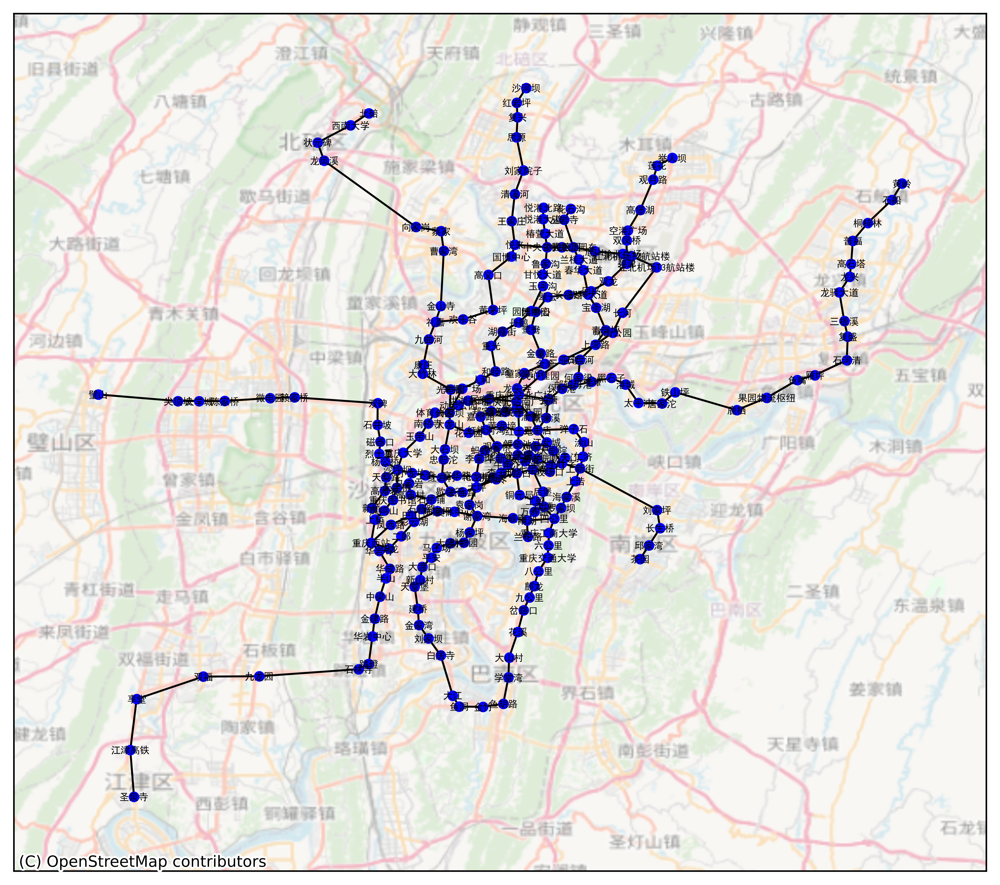

In [31]:
fig, ax = plt.subplots(figsize=(12,8), dpi=500)
nx.draw_networkx(G,
                 pos=dic,
                 with_labels=True,
                 font_family='SimHei',
                 node_size=20,
                 font_size=5,
                 font_color='black',
                 font_weight='bold',
                 node_color='blue',
                 edge_color='black',
                 ax=ax)
cx.add_basemap(ax, crs=metro_sts.crs.to_string(), 
               source=cx.providers.OpenStreetMap.Mapnik,
               alpha=0.5)

In [32]:
degree_c = nx.degree_centrality(G)
betweenness_c = nx.betweenness_centrality(G,weight='distance')
closeness_c = nx.closeness_centrality(G)
#joblib.dump({'degree_c':degree_c,'betweenness_c':betweenness_c,'closeness_c':closeness_c}, 'D:/CASApre/CASA06DSSS_assessment/data/centrality.joblib')

In [102]:
# takes two minutes
## already saved and push to github
## here we skip this part
'''
osm_fl = 'D:/CASApre/CASA06DSSS_assessment/data/map.osm'
net= og.getNetFromFile(osm_fl)
net

'''

arguments used for network parsing:
  filename: D:/CASApre/CASA06DSSS_assessment/data/map.osm
  network_types: ('auto',)
  link_types: all
  POI: False
  POI_sampling_ratio: 1.0
  strict_mode: True
  offset: no
  min_nodes: 1
  combine: False
  bbox: None
  default_lanes: False
  default_speed: False
  default_capacity: False
  start_node_id: 0
  start_link_id: 0

Building Network from OSM file
  reading osm file
  parsing osm network
    generating nodes and links
  number of nodes: 69013, number of links: 134093, number of pois: 0


In [103]:
'''
og.outputNetToCSV(net)
'''

Outputting Network Files


In [33]:
link = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/link.csv')
node = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/node.csv')

In [34]:
gs = gpd.GeoSeries.from_wkt(link['geometry'])
rds = gpd.GeoDataFrame(link[['link_id','length','from_node_id','to_node_id']], geometry=gs, crs='epsg:4326')

gs= gpd.points_from_xy(node['x_coord'], node['y_coord'])
pts = gpd.GeoDataFrame(node[['node_id']], geometry=gs, crs='epsg:4326')

<Axes: >

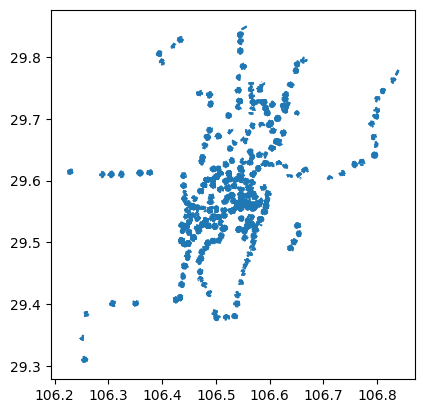

In [35]:
final_msa=final_msa.to_crs(4326)
rds2 = rds.overlay(final_msa, how='intersection')

rds2.plot()

In [36]:
link_rd = rds2[['link_id','length','from_node_id','to_node_id']]
# link_rd.to_csv('link_rd.csv', index=False)
G = nx.from_pandas_edgelist(link_rd, 
                            source='from_node_id', 
                            target='to_node_id', 
                            edge_attr=['link_id','length'])

In [37]:
%%time
## takes 6 mins
out = nx.betweenness_centrality(G, weight='distance')

CPU times: total: 50.7 s
Wall time: 5min 14s


<Axes: >

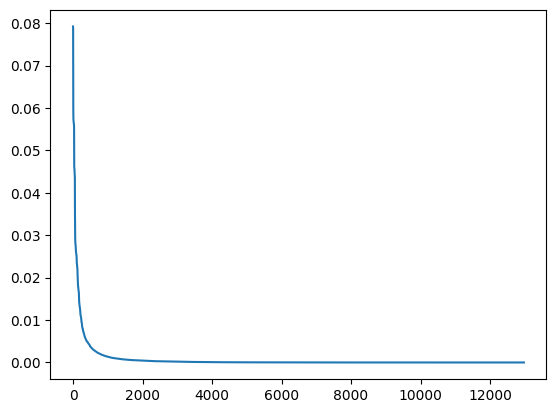

In [38]:
top30 = int(len(out)*0.3)
top30

node_bt = pd.DataFrame(out, index=[0]).T.sort_values(by=0, ascending=False)
node_bt.reset_index()[0].plot()

In [39]:
node_30p = node_bt.head(top30).index

In [40]:
# find which msa the node belong
ptsx = pts[pts['node_id'].isin(node_30p)]
result = gpd.sjoin(final_msa, ptsx,predicate='contains')

final_street_bt = (result.groupby(by='MSA')['node_id'].count() / top30).reset_index().sort_values(by='node_id').rename(columns={'node_id':'bt_30'})
final_street_bt.to_csv('data/street_accessibility.csv', index=False)

In [41]:
# time to cbd
metrocbd = pd.read_csv('https://github.com/yiyansun/spatial-ds/raw/main/data/od_metro2cbd_result.csv')
time_to_cbd = metrocbd.groupby(by='from')['duration'].mean().reset_index()
time_to_cbd.columns = ['MSA','duration']

In [42]:
# identify if inside CBD or if as tranfer station or not
cbd = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/cbd.geojson')
final_msa['geometry']=final_msa['geometry'].representative_point()
is_cbd = gpd.sjoin(final_msa,cbd,predicate='within')['MSA'].unique()
is_cbd

array(['临江门', '较场口', '江北城', '大剧院', '涂山', '弹子石'], dtype=object)

In [43]:
num=final_msa['MSA'].value_counts()
is_interchange = num[num > 1].index
is_interchange


Index([          0,       '五里店',       '冉家坝',       '沙坪坝',   '重庆北站南广场',
            '重庆西站',      '民安大道',       '谢家湾',       '上新街',     '重庆图书馆',
             '四公里',        '南湖',        '二郎', '江北机场T2航站楼',       '鲤鱼池',
             '观音桥',        '南坪',       '上湾路',     '中央公园东',       '曾家岩',
              '碧津',        '头塘',        '悦来',       '王家庄',   '重庆北站北广场',
             '保税港',       '江北城',       '红土地',        '礼嘉',     '中央公园西',
             '小什字',        '跳磴',       '大龙山',       '红岩村',       '牛角沱',
              '华龙',      '红旗河沟',      '重庆大学',      '奥体中心',      '动步公园',
             '海峡路',       '罗家坝',       '石桥铺',       '天星桥',       '小龙坎',
             '海棠溪',        '鱼洞',       '歇台子',       '玉带山',        '上浩',
              '仁济',        '涂山',       '南桥寺',      '体育公园',       '弹子石',
              '渝鲁',       '陈家坪',      '洪湖东路',        '上桥',       '凤鸣山',
             '七星岗',       '较场口',       '彩云湖',       '两路口',        '大坪'],
      dtype='object', name='MSA')

In [44]:
final_msa['is_cbd'] = final_msa['MSA'].apply(lambda x: 1 if x in is_cbd else 0)
final_msa['is_interchange'] = final_msa['MSA'].apply(lambda x: 1 if x in is_interchange else 0)

is_cbd_is_inter = final_msa[['MSA','is_cbd','is_interchange']]

db = {'bus_sts_num':bus_sts_num, 
      'time_to_cbd':time_to_cbd, 
      'is_cbd_is_inter':is_cbd_is_inter}

joblib.dump(db, 'data/bus_t_i.joblib')

['data/bus_t_i.joblib']

<a id="ID_analyse"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 6.0 | Analysis

In [ ]:
# final_msa 
y = gpd.read_file('https://github.com/yiyansun/spatial-ds/raw/main/data/final_msa.geojson')
# house price
x1 = pd.read_csv('
x2 = pd.read_csv('
x3 = joblib.load('')
# centrality
x4 = joblib.load('https://github.com/yiyansun/spatial-ds/raw/main/data/centrality.joblib')


In [ ]:
data = y.merge(x1, how='left').merge(x2, how='left').\
    merge(x3['bus_sts_num'], how='left').\
    merge(x3['time_to_cbd'], how='left').\
    merge(x3['is_cbd_is_inter'], how='left')

In [ ]:
data['degree_c'] = data['MSA'].map(x4['degree_c'])
data['betweenness_c'] = data['MSA'].map(x4['betweenness_c'])
data['closeness_c'] = data['MSA'].map(x4['closeness_c'])

In [ ]:
data = data.drop_duplicates(subset='MSA')
data = data.dropna(subset=['price'], inplace=True)

In [ ]:
y_new = data[['poi_count']]
x = data.iloc[:, 2:]

In [ ]:
y_new = (np.log(y_new)).round(2)

In [ ]:
sns.heatmap(x.corr(), annot=True,
            linecolor='white',linewidths=0.5,
            vmin=-1,vmax=1)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    x, 
    y_new,
    test_size=0.2, 
    random_state=1,
    shuffle=True)

In [ ]:
model = LinearRegression()
model.get_params()

In [ ]:
model.fit(X_train, y_train)

In [ ]:
model.score(X_train, y_train)

In [ ]:
model.score(X_test, y_test)

In [ ]:
params = {'num_leaves': [2,4,6,8,10],
          'n_estimators': [5,10,100,200,300,400,500,1000],
          'min_child_samples': [5,10,20,30]}

In [ ]:
grid_search = GridSearchCV(estimator=model, param_grid=params, cv=5, refit=True, verbose=False)

In [ ]:
grid_search.fit(X_train, y_train)

In [ ]:
grid_search.best_params_

In [ ]:
grid_search.best_score_

In [ ]:
model.set_params(**grid_search.best_params_)

In [ ]:
model_cv = cross_validate(model, X_train, y_train, cv=5, verbose=3, return_estimator=True)

In [ ]:
model_cv['test_score'].mean()

In [ ]:
final_model = model_cv['estimator'][0]

In [ ]:
y_pred

In [ ]:
#loss
mean_absolute_error(y_test, y_pred)

In [ ]:
final_model.score(X_test, y_test)

In [ ]:
joblib.dump(final_model, 'model/final_model.joblib')
joblib.dump({'X':}, 'model/model.joblib')

<a id="ID_conclude"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## 7.0 | Discussion and conclusion

<a id="ID_biblio"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |


***
## Bibliography


<a id="ID_append"></a>
| [1.0 Intro](#ID_intr) | [2.0 Lit. review](#ID_lit) | [3.0 Method](#ID_method) | [4.0 Data](#ID_data) | [5.0 Explore](#ID_explore) | [6.0 Analysis](#ID_analyse) | [7.0 Discussion and conclusion](#ID_conclude) | [Bibliography](#ID_biblio) | [Appendix](#ID_append) |

## Appendix